*  Course: DSC_540
*  Assignment: MileStone 4
*  Nels Findley

# Showing part of Milestone 4 

This is to loop through video game from the kaggle dataset and save to api_dataset.csv.  Skip to header MileStone5 to see new code

In [1]:
# Import libraries
import requests
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import re

# Environment setup
# Removed secrets
CLIENT_ID = ""
CLIENT_SECRET = ""

In [2]:
import requests
import json
import pandas as pd 
from typing import Union, List

# Twitch API Endpoints
TWITCH_AUTH_URL = 'https://id.twitch.tv/oauth2/token'
TWITCH_GAMES_URL = 'https://api.twitch.tv/helix/games'
IGDB_API_URL = 'https://api.igdb.com/v4/games'

# Get twitch access token using client_id and client_secret
def get_twitch_access_token(client_id: str, client_secret: str) -> Union[str, None]:
    # Payload to return twitch token
    payload = {
        'client_id': client_id,
        'client_secret': client_secret,
        'grant_type': 'client_credentials'
    }
    try:
        response = requests.post(TWITCH_AUTH_URL, data=payload)
        response.raise_for_status() # Raise an HTTPError for bad responses (4xx or 5xx)
        token_data = response.json()
        return token_data.get('access_token')
    except requests.exceptions.RequestException as e:
        print(f"Error obtaining Twitch access token: {e}")
        return None

# Get basic information from game name
def get_twitch_game_info(game_name: str, client_id: str, access_token: str) -> Union[dict, None]:
    headers = {
        'Client-ID': client_id,
        'Authorization': f'Bearer {access_token}'
    }
    params = {
        'name': game_name
    }
    try:
        response = requests.get(TWITCH_GAMES_URL, headers=headers, params=params)
        response.raise_for_status() # Raise an HTTPError for bad responses (4xx or 5xx)
        game_data = response.json()

        if game_data and game_data.get('data'):
            # This normally return a list. Only the first result is required to get igdb_id
            return game_data['data'][0]
        else:
            return None
    except requests.exceptions.RequestException as e:
        print(f"Error searching for game '{game_name}' on Twitch: {e}")
        return None

# Fetch game summary with igdb_id
def get_igdb_game_details(igdb_id: int, client_id: str, access_token: str) -> Union[dict, None]:
    headers = {
        'Client-ID': client_id,
        'Authorization': f'Bearer {access_token}',
        'Content-Type': 'text/plain' # IGDB uses a plain text body for Apicalypse queries
    }
    # Optional query to use data = f"fields name, summary, storyline, cover.url; where id = {igdb_id};"
    data = f"fields name, summary; where id = {igdb_id};"
    
    try:
        response = requests.post(IGDB_API_URL, headers=headers, data=data)
        response.raise_for_status() # Raise an HTTPError for bad responses (4xx or 5xx)
        igdb_data = response.json()

        if igdb_data:
            # IGDB also returns a list, even for a single ID query
            return igdb_data[0]
        else:
            # print(f"No detailed information found on IGDB for ID: {igdb_id}.") # Suppress for batch processing
            return None
    except requests.exceptions.RequestException as e:
        print(f"Error fetching IGDB details for ID {igdb_id}: {e}")
        return None

# Fetch game_summaries for list game names
def get_game_summaries_to_dataframe(game_names: List[str], client_id: str, client_secret: str) -> pd.DataFrame:
    if client_id == 'YOUR_TWITCH_CLIENT_ID' or client_secret == 'YOUR_TWITCH_CLIENT_SECRET':
        print("Please update CLIENT_ID and CLIENT_SECRET")
        return pd.DataFrame() # Return empty DataFrame if credentials are not set

    access_token = get_twitch_access_token(client_id, client_secret)

    if not access_token:
        print("Failed to obtain Twitch/IGDB access token. Cannot proceed with game search.")
        return pd.DataFrame() # Return empty DataFrame on token failure

    # Initialize an empty list to store game data
    all_game_data = []

    for game_name in game_names:
        # Only needed for debugging print(f"Processing game: {game_name}...")
        game_row = {'Game Name': game_name, 'Twitch ID': None, 'IGDB ID': None,
                    'Summary': None}

        twitch_game_info = get_twitch_game_info(game_name, client_id, access_token)

        if twitch_game_info:
            game_row['Twitch ID'] = twitch_game_info.get('id')
            igdb_id = twitch_game_info.get('igdb_id')
            game_row['IGDB ID'] = igdb_id

            if igdb_id:
                igdb_details = get_igdb_game_details(igdb_id, client_id, access_token)
                if igdb_details:
                    game_row['Summary'] = igdb_details.get('summary')
                    if igdb_details.get('cover') and igdb_details['cover'].get('url'):
                        cover_url = igdb_details['cover']['url']
                        if not cover_url.startswith('http'):
                            cover_url = f"https:{cover_url}"
                        game_row['Cover Art URL'] = cover_url
                """ else:
                    #print(f"  Could not retrieve detailed summary from IGDB for IGDB ID: {igdb_id}.")
            else:
                #print(f"  No IGDB ID found for '{game_name}' from Twitch API. Cannot fetch detailed summary.")
        else:
            #print(f"  Could not find basic Twitch game information for '{game_name}'.")
        """
        all_game_data.append(game_row)
    # Create DataFrame from the collected data
    df = pd.DataFrame(all_game_data)
    return df


In [3]:
# Load kaggle dataset
df_kaggle = pd.read_csv('kaggle_dataset.csv')
game_list = df_kaggle['game_name'].tolist()

In [4]:
# load list from of games from kagle dataset
game_summaries_df = get_game_summaries_to_dataframe(game_list, CLIENT_ID, CLIENT_SECRET)

In [7]:
game_summaries_clean_df = game_summaries_df
game_summaries_clean_df.to_csv('game_summaries_clean_df_temp.csv', index=False)

In [25]:
game_summaries_clean_df = pd.read_csv('game_summaries_clean_df_temp.csv')
game_summaries_clean_df.shape

(2175, 5)

In [26]:
# Transforms from MileStone 4
game_summaries_clean_df = game_summaries_clean_df.drop(['Twitch ID', 'IGDB ID'], axis=1)
game_summaries_clean_df['Summary_preprocessed'] = game_summaries_clean_df['Summary'].str.lower()
game_summaries_clean_df['Summary_preprocessed'] = game_summaries_clean_df['Summary_preprocessed'].str.replace(r'[^\w\s]', '', regex=True)
game_summaries_clean_df['Summary_preprocessed'] = game_summaries_clean_df['Summary_preprocessed'].str.replace(r'\d+', '', regex=True)
game_summaries_clean_df['Summary_preprocessed'] = game_summaries_clean_df['Summary_preprocessed'].str.replace(r'\s+', ' ', regex=True).str.strip()
game_summaries_clean_df = game_summaries_clean_df.dropna()
game_summaries_clean_df['Summary_tokens'] = game_summaries_clean_df['Summary_preprocessed'].apply(word_tokenize)

stop_words = set(stopwords.words('english'))
game_summaries_clean_df['Summary_no_stopwords'] = game_summaries_clean_df['Summary_tokens'].apply(
    lambda x: [word for word in x if word not in stop_words]
)
stemmer = PorterStemmer()
game_summaries_clean_df['Summary_stemmed'] = game_summaries_clean_df['Summary_no_stopwords'].apply(
    lambda x: [stemmer.stem(word) for word in x]
)
print(game_summaries_clean_df[['Game Name', 'Summary', 'Summary_tokens', 'Summary_no_stopwords', 'Summary_stemmed']].head())
game_summaries_clean_df.to_csv('api_dataset.csv', index=False)

               Game Name                                            Summary  \
0  ELDEN RING NIGHTREIGN  Elden Ring: Nightreign is a standalone adventu...   
2  Red Dead Redemption 2  Red Dead Redemption 2 is the epic tale of outl...   
4        Project Zomboid  Project Zomboid is the ultimate in zombie surv...   
5                   Rust  The only aim in Rust is to survive. Everything...   
6                 F1® 25  Leave your mark on the world of racing in F1 2...   

                                      Summary_tokens  \
0  [elden, ring, nightreign, is, a, standalone, a...   
2  [red, dead, redemption, is, the, epic, tale, o...   
4  [project, zomboid, is, the, ultimate, in, zomb...   
5  [the, only, aim, in, rust, is, to, survive, ev...   
6  [leave, your, mark, on, the, world, of, racing...   

                                Summary_no_stopwords  \
0  [elden, ring, nightreign, standalone, adventur...   
2  [red, dead, redemption, epic, tale, outlaw, ar...   
4  [project, zomboid

# Start of MileStone 5 for database

In [2]:
import pandas as pd
import sqlite3 # SQLite is built-in with Python

# Load datasets from previous milestones

df_kaggle = pd.read_csv('kaggle_dataset.csv')
df_html = pd.read_csv('html_dataset.csv')
df_api = pd.read_csv('api_dataset.csv')

# Define the SQLite database file name
db_file = 'video_games.db'

In [3]:
# Establish db connection
conn = sqlite3.connect(db_file)

In [4]:
# Load different dataset into seperate tables
df_kaggle.to_sql('Kaggle_dataset', conn, if_exists='replace', index=False)
df_html.to_sql('Html_dataset', conn, if_exists='replace', index=False)
df_api.to_sql('Api_dataset', conn, if_exists='replace', index=False)

1835

In [5]:
# Use join query to select all from the tables and join them based on video game name
join_query = """
    SELECT
        k.*,
        h.*,
        a.*
    FROM
        Kaggle_dataset k
    LEFT JOIN
        Html_dataset h ON k.game_name = h.Name
    LEFT JOIN
        Api_dataset a ON k.game_name = a."Game Name"
    """

joined_df_from_db = pd.read_sql_query(join_query, conn)
# Close db connection
conn.close()
# Display first 5
print(joined_df_from_db.head().to_markdown(index=False))

| game_name              |   reviews_like_rate |   all_reviews_number | release_date   | developer          | user_defined_tags                                              | supported_os    | supported_languages                                                                                                                                                                                                                                                                              |   price | other_features                                                                                                                                                                                     |   age_restriction |   rating |   difficulty |   length_in_hours |   estimated_downloads | Name   | %   | Price   | Rating   | Release   | Ends   | Started   | Game Name             | Summary                                                                                                                       

In [6]:
# import libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt


<Axes: xlabel='all_reviews_number', ylabel='rating'>

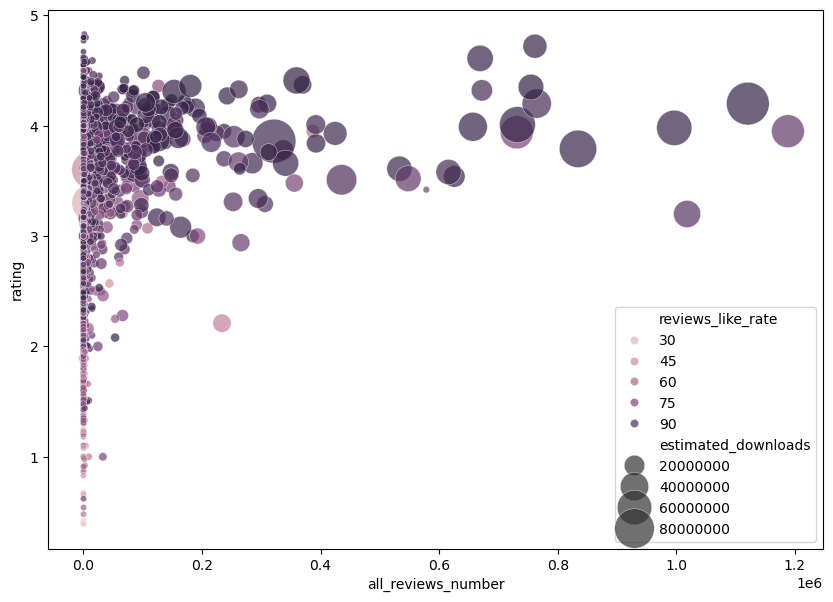

In [16]:
# Create Scatter plot for reviews vs ratings
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=joined_df_from_db,
    x='all_reviews_number',
    y='rating',
    hue='reviews_like_rate', #change color by rating
    size='estimated_downloads',
    sizes=(20, 1000), # allow bubble size to change
    alpha=0.7
)

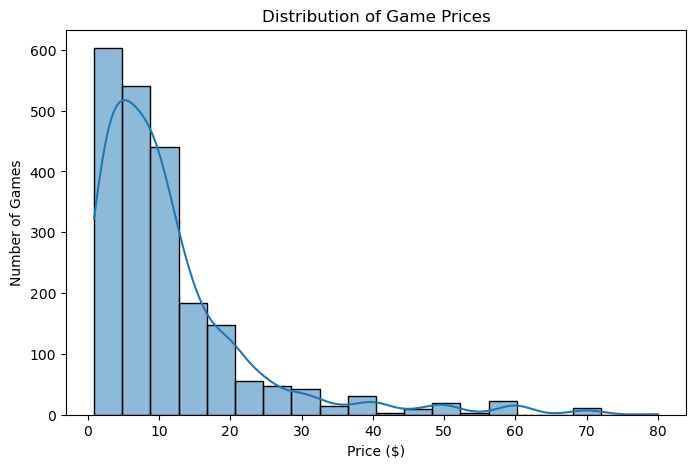

In [8]:
# Show Distribution of Game prices
plt.figure(figsize=(8, 5))
sns.histplot(data=joined_df_from_db, x='price', bins=20, kde=True) # kde=True adds a density curve
plt.title('Distribution of Game Prices')
plt.xlabel('Price ($)')
plt.ylabel('Number of Games')
plt.show()

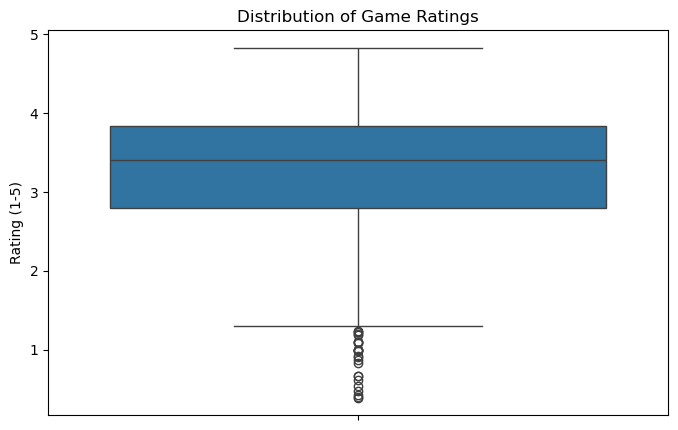

In [9]:
# Show distribution of game rating
plt.figure(figsize=(8, 5))
sns.boxplot(data=joined_df_from_db, y='rating')
plt.title('Distribution of Game Ratings')
plt.ylabel('Rating (1-5)')
plt.show()

In [14]:
# Use data from release_date from kaggle dataset and price from html dataset
# Convert release_date to datetime objects
joined_df_from_db['release_date'] = pd.to_datetime(joined_df_from_db['release_date'])

# Make a scatter plot
chart = alt.Chart(joined_df_from_db).mark_circle(size=60).encode(
    x=alt.X('release_date', title='Release Date'),
    y=alt.Y('price', title='Price (\$)'),
    tooltip=['game_name', 'release_date', 'price']
).properties(
    title='Price vs. Release Date for Games'
).interactive()
chart

alt.Chart(...)

In [20]:
# Create a scatter plot to compare 'Rating' from html dataset  and 'rating' from the kaggle dataset
chart = alt.Chart(joined_df_from_db).mark_circle(size=60).encode(
    x=alt.X('Rating', title='Rating (HTML)'),
    y=alt.Y('rating', title='rating (Kaggle)'),
    tooltip=['game_name', 'Rating', 'rating']
).properties(
    title='Comparison of Rating (HTML) and rating (Kaggle)'
).interactive()
chart

alt.Chart(...)

# Summary


For this final milestone, I revisited the previous project phases to consolidate and prepare the datasets for integration into a SQLite database. This involved rerunning earlier analyses to save the processed data into CSV files, which were then seamlessly loaded into separate tables within the database.

A significant update was made to the API assignment, where I expanded the scope to include the full list of video game names from the Kaggle dataset, moving beyond a limited subset. This comprehensive approach ensured a richer and more representative dataset for our analysis. All three datasets were loaded without issue, and I successfully performed joins based on the video game names, creating a unified and interconnected database.

From a legal and regulatory standpoint, I anticipate minimal to no concerns. The core of my data consists of publicly available video game information, primarily sourced from platforms like Steam and the Twitch API. The Kaggle data itself was ethically compiled by its original author from readily accessible sources such as Steam, GameFAQs, and SteamDB. Crucially, the datasets contain no personal or sensitive information, and all game performance metrics are publicly accessible on the Steam platform.

I've identified two primary areas of potential risk during the project. The first originated in Milestone 1, where I intentionally removed free games and titles with fewer than 1,000 downloads. While this data is no longer present in the transformed dataset, I made the analytical decision that these less-downloaded games were not central to our objectives. The second risk emerged during Milestone 3, concerning the cleaning and standardization of video game names. There's always a slight possibility of erroneous data slipping through; however, I diligently reviewed the initial 100 rows and am confident that I've accounted for the current data landscape, mitigating this risk effectively.